# Setup

In [ ]:
!pip install -qU openai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 75.1 MB/s eta 0:00:00


   - `transformers`: biblioteka do przetwarzania języka naturalnego
   - `diffusers`: narzędzie do generowania obrazów
   - `accelerate`: biblioteka do optymalizacji obliczeń na GPU
   - `openai`: oficjalne API OpenAI
   - `sentencepiece`: biblioteka do tokenizacji tekstu
   - `bitsandbytes`: narzędzie do kwantyzacji modeli uczenia maszynowego

In [ ]:
# Standard library imports
import base64

# Third-party library imports
from google.colab import userdata
from openai import OpenAI
from IPython.display import Image

In [ ]:
class CFG:
    model1 = "gpt-4o-mini"


# GPT4-vision setup
client = OpenAI(api_key=userdata.get("openaivision"))

# Functions

In [6]:
# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')


Kodowanie obrazu do formatu base64 jest często używane, gdy trzeba przesłać obraz jako część zapytania API lub gdy chcemy osadzić obraz bezpośrednio w HTML lub JSON. Jest to sposób na reprezentowanie danych binarnych w formacie tekstowym, co ułatwia ich przesyłanie i przetwarzanie w różnych systemach.

In [ ]:
def describe_image(image_path, prompt, model, max_tokens=512):
    base64_image = encode_image(image_path)

    response = client.chat.completions.create(
        model=model,
        messages=[
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": prompt},
                    {
                        "type": "image_url",
                        "image_url": {
                            "url": f"data:image/jpeg;base64,{base64_image}",
                        },
                    },
                ],
            }
        ],
        max_tokens=max_tokens,
    )

    description = response.choices[0].message.content

    return description

Funkcja `describe_image` służy do generowania opisu obrazu przy użyciu modelu AI. Oto szczegółowe wyjaśnienie jej działania:

1. Struktura zapytania jest zgodna z formatem wymaganym przez API OpenAI dla modeli obsługujących analizę obrazów.

2. Po otrzymaniu odpowiedzi od API, funkcja wyodrębnia treść opisu z pierwszej (i jedynej) wygenerowanej odpowiedzi.

3. Zwraca wygenerowany opis obrazu.

Ta funkcja umożliwia wykorzystanie zaawansowanych modeli AI do analizy i opisu obrazów. Może być używana do automatycznego generowania podpisów pod zdjęciami, analizy zawartości obrazów lub jako część większego systemu przetwarzania danych wizualnych.

# Model

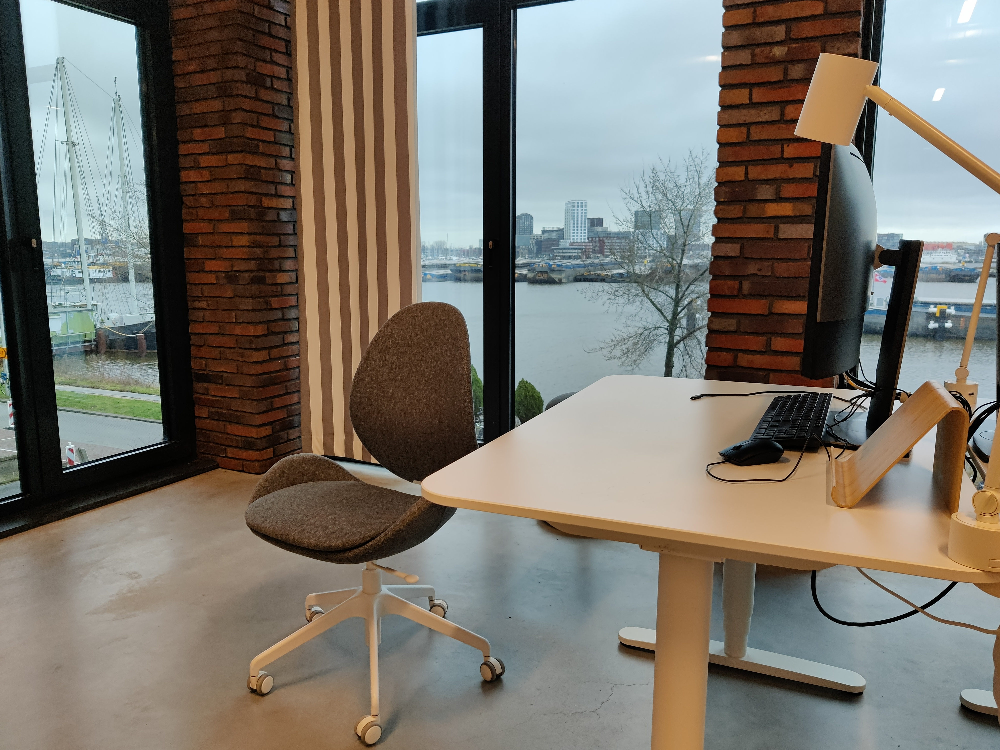

In [ ]:
# img1

image_path = "/content/img1.png"

Image(image_path)


In [9]:
prompt = "Opisz ten obraz krok po kroku, z detalami."
descr1 = describe_image(image_path, prompt, CFG.model1)
print(descr1)

Na obrazie widzimy nowoczesne, minimalistyczne biuro z dużym oknem, przez które widać widok na wodę oraz port. 

1. **Tło i okna**: W centralnej części obrazu znajdują się dwa duże okna, z widokiem na niewielką łodzią i zarazem na miejską panoramę. Okna są otoczone ceglaną ścianą, co nadaje całemu wnętrzu przytulny, industrialny klimat. 

2. **Ściana**: Po lewej stronie widać ceglaną ścianę, która kontrastuje z prostymi, białymi powierzchniami mebli. Układ cegieł dodaje charakteru Pomieszczeniu.

3. **Zasłony**: W oknach znajdują się zasłony w pionowe, jasne pasy, które wpuszczają naturalne światło.

4. **Meble**:
   - **Biurko**: Na pierwszym planie widać białe biurko o prostokątnym kształcie, które znajduje się w lewym dolnym rogu obrazu. Na blacie leży czarny komputer stacjonarny z monitorem.
   - **Krzesło**: Obok biurka stoi ergonomiczne krzesło w kolorze szarym, z oparciem o ciekawym kształcie. Jest osadzone na białej, mobilnej podstawie z kółkami.

5. **Dodatki**: Na biurku znaj

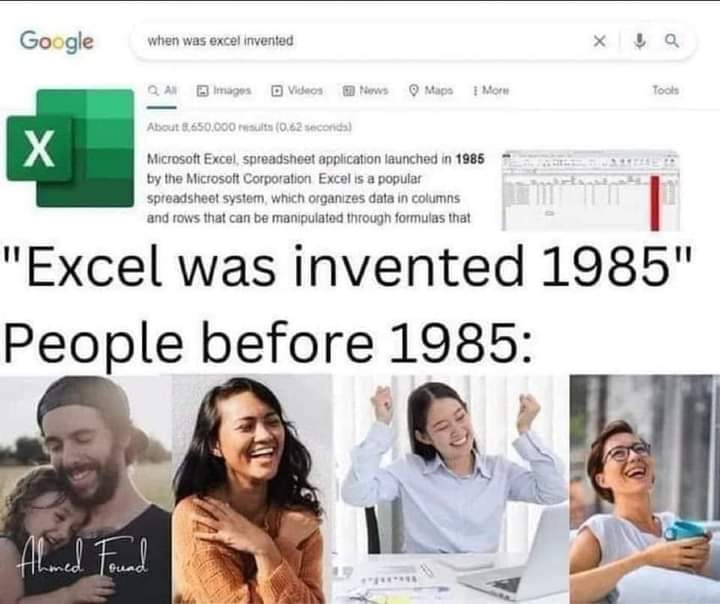

In [ ]:
# img2

image_path = "/content/img2.jpg"

Image(image_path)


In [11]:

prompt = "Wytłumacz ten mem."
descr2 = describe_image(image_path, prompt, CFG.model1)
print(descr2)

Ten mem odnosi się do momentu, kiedy powstał Microsoft Excel, z wyraźnie podkreślonym rokiem 1985. W górnej części obrazu widzimy zrzut ekranu z wyszukiwania Google, które informuje, że Excel został wprowadzony w tym roku. 

Pod tym odnajdujemy tekst: "Excel was invented 1985" (Excel został wynaleziony w 1985), a poniżej zdjęcia ludzi uśmiechających się i wyglądających na szczęśliwych. Całość ma na celu ukazanie, że przed wynalezieniem Excela ludzie żyli i cieszyli się życiem, co sugeruje, że Excel jest tylko narzędziem, a świat nie kręcił się wyłącznie wokół niego. 

Mem ma humorystyczny wydźwięk, wskazując, że chociaż Excel jest popularnym narzędziem do pracy z danymi, życie ludzkie nie jest uzależnione od technologii, która pojawiła się dopiero w 1985 roku.


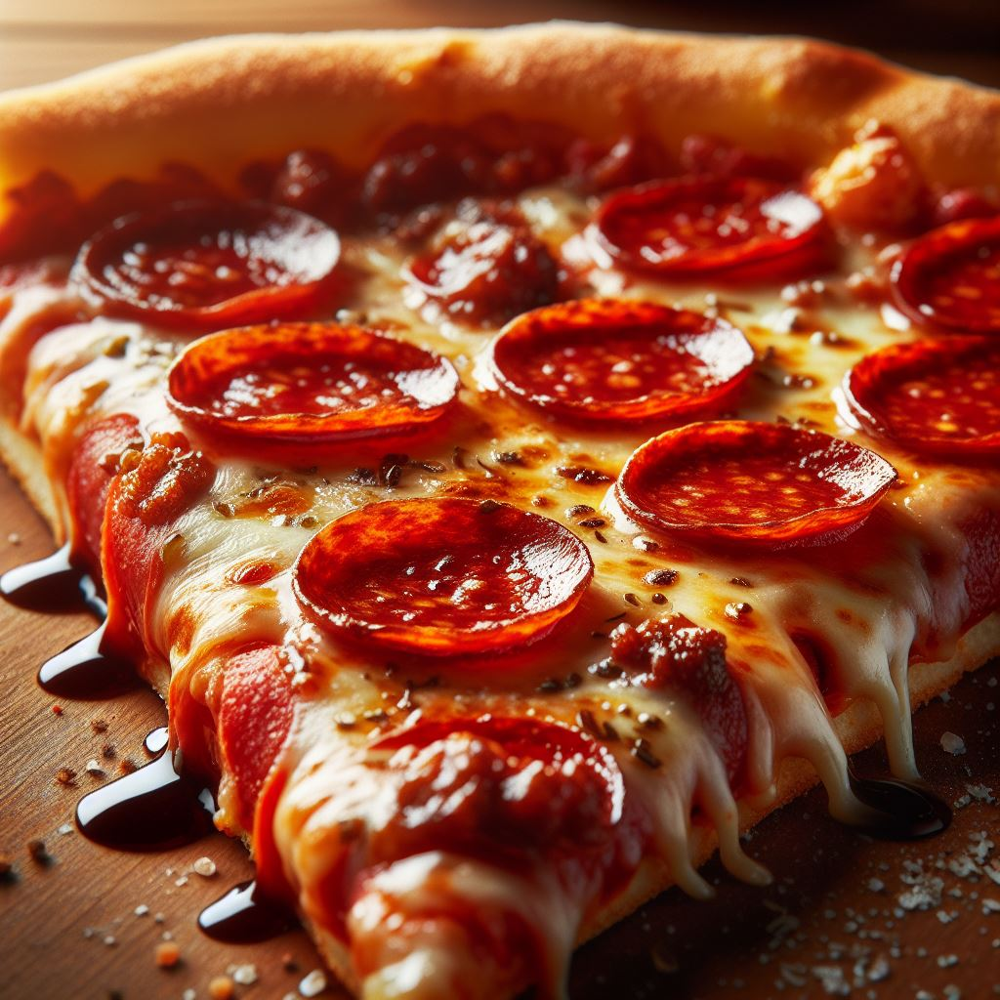

In [ ]:
# img3

image_path = "/content/img3.jpg"

Image(image_path)

In [13]:

prompt = "Podaj przepis na przyrządzenie tego dania"
descr3 = describe_image(image_path, prompt, CFG.model1)
print(descr3)

Oto przepis na pizzę z pepperoni:

### Składniki:

#### Na ciasto:
- 500 g mąki pszennej
- 300 ml ciepłej wody
- 7 g drożdży instant
- 1 łyżeczka cukru
- 1 łyżeczka soli
- 2 łyżki oliwy z oliwek

#### Na sos:
- 400 g pomidorów z puszki (lub passaty)
- 1 ząbek czosnku (obrany i posiekany)
- 1 łyżeczka suszonego oregano
- Sól i pieprz do smaku

#### Na wierzch:
- 200 g sera mozzarella (tartej)
- 100 g kiełbasy pepperoni (pokrojonej w plasterki)
- Opcjonalnie: świeże zioła (np. bazylia) do dekoracji

### Instrukcja:

1. **Przygotowanie ciasta:**
   - W dużej misce wymieszaj ciepłą wodę, drożdże i cukier. Pozostaw na 5-10 minut, aż drożdże się spienią.
   - Dodaj mąkę, sól i oliwę. Wyrób ciasto ręcznie lub w robocie kuchennym przez około 10 minut, aż będzie gładkie i elastyczne.
   - Przykryj ciasto ściereczką i odstaw na 1-2 godziny w ciepłe miejsce, aż podwoi objętość.

2. **Przygotowanie sosu:**
   - W małym garnku rozgrzej odrobinę oliwy, dodaj czosnek i smaż przez chwilę (nie przypal)

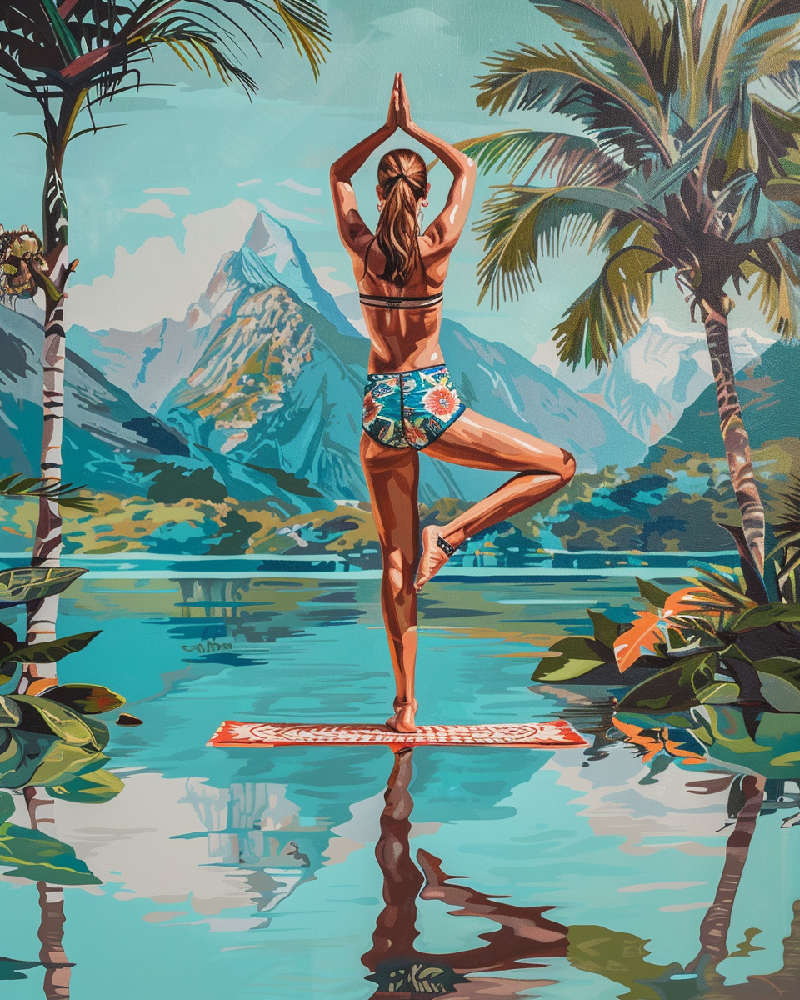

In [ ]:
# img4

image_path = "/content/img4.png"

Image(image_path)

In [15]:

prompt = "Opisz ten obraz jak krytyk sztuki"
descr4 = describe_image(image_path, prompt, CFG.model1)
print(descr4)

Obraz, który mamy przed sobą, emanuje spokojem i harmonią, a jednocześnie stanowi wyraz tęsknoty za naturą i wewnętrzną równowagą. Ujęcie młodej kobiety wykonującej asanę jogi na desce na tle majestatycznych gór i bujnej roślinności tropikalnej przekształca scenę w symbol odnowy i wewnętrznego zrównoważenia.

Kompozycja jest starannie zbalansowana. Postać w centrum, z uniesionymi rękami, zdaje się być w pełni zespolona z otoczeniem — jej sylwetka harmonijnie wpasowuje się w refleksy w wodzie. Użycie intensywnych kolorów, takich jak błękity i zielenie, kontrastuje z ciepłymi tonami skóry modelki, generując efekt wizualnej głębi i namacalnej lekkości.

Palmy na bokach obrazu oraz wpływ wody dodają scenie egzotycznego klimatu, tworząc iluzję raju, w którym można odnaleźć spokój ducha. Górzyste tło nasuwa myśli o wspinaczce do wyższych stanów świadomości, a zarazem przypomina o potędze natury.

Artysta zręcznie wykorzystuje technikę kolorystyczną, by uchwycić nie tylko zewnętrzne piękno, l